# Epipolar geometry demo: computing fundamental matrix with OpenCV

In [38]:
import cv2
cv2.__version__  # tested with version 3.4.2
# need to install opencv-contrib-python for sift to work

'3.4.2'

In [39]:
import cv2
import numpy as np
import io
import requests
from PIL import Image
from matplotlib import pyplot as plt


IMG_URL1='https://raw.githubusercontent.com/phsamuel/test-images/master/IMAG4627.jpg'
IMG_URL2='https://raw.githubusercontent.com/phsamuel/test-images/master/IMAG4628.jpg'

# get images from the web
response = requests.get(IMG_URL1)
img_pil1 = Image.open(io.BytesIO(response.content))

response = requests.get(IMG_URL2)
img_pil2 = Image.open(io.BytesIO(response.content))

### show images

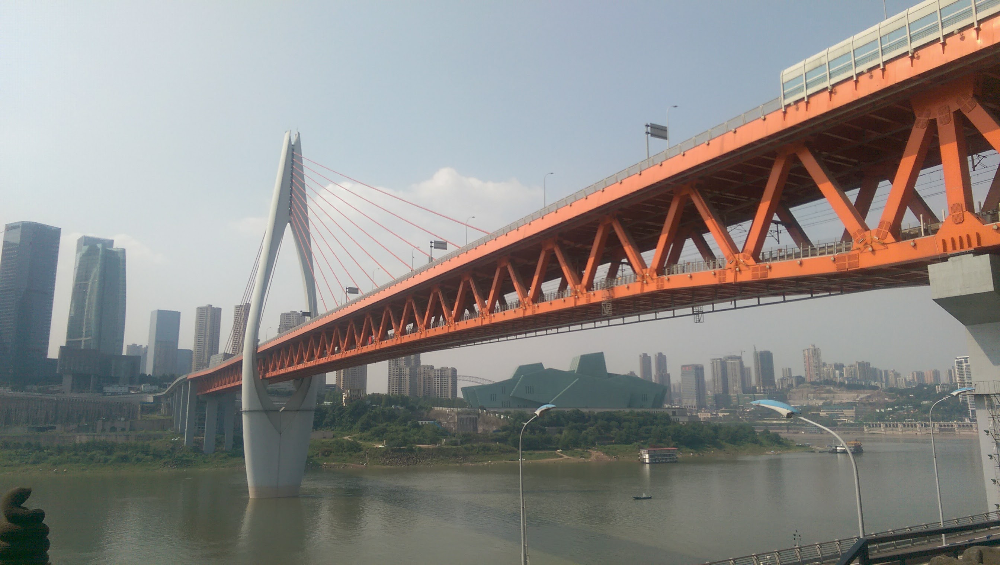

In [40]:
img_pil1

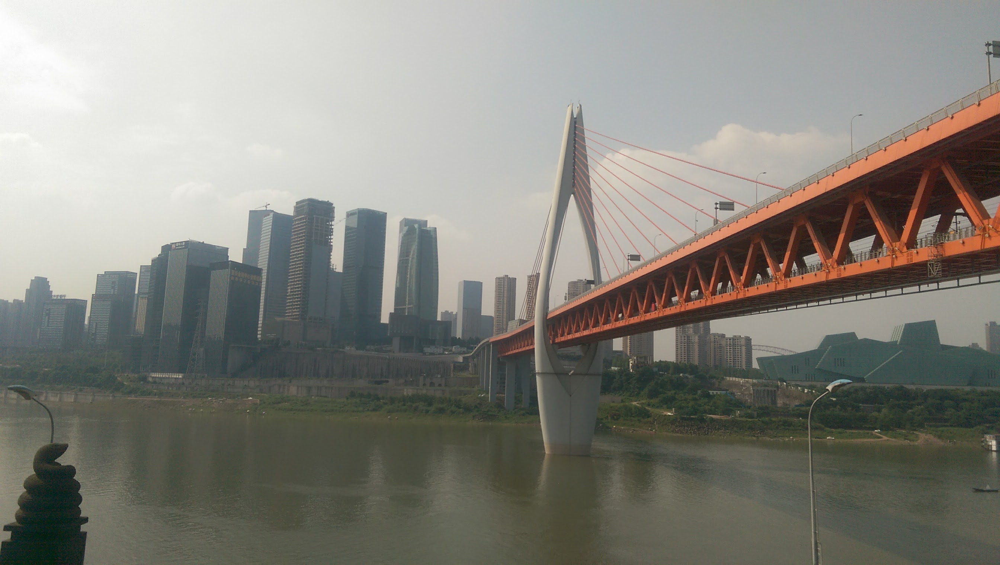

In [41]:
img_pil2

### convert from PIL to opencv images, resize, and change to gray scale

In [43]:
img1c = np.array(img_pil1) 
img2c = np.array(img_pil2) 

img1c=cv2.resize(img1c,(0,0),fx=0.5,fy=0.5)
img2c=cv2.resize(img2c,(0,0),fx=0.5,fy=0.5)

img1 = cv2.cvtColor(img1c, cv2.COLOR_RGB2GRAY)
img2 = cv2.cvtColor(img2c, cv2.COLOR_RGB2GRAY)

### Find match points with SIFT

In [44]:
sift = cv2.xfeatures2d.SIFT_create() #SIFT()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params,search_params)
matches = flann.knnMatch(des1,des2,k=2)

good = []
pts1 = []
pts2 = []

# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.3*n.distance:
        good.append(m)
        pts2.append(kp2[m.trainIdx].pt)
        pts1.append(kp1[m.queryIdx].pt)
        

### compute fundamental matrix

In [45]:
pts1 = np.int32(pts1)
pts2 = np.int32(pts2)
F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.FM_LMEDS)
# We select only inlier points
pts1 = pts1[mask.ravel()==1]
pts2 = pts2[mask.ravel()==1]

### Visualize: show epipolar lines

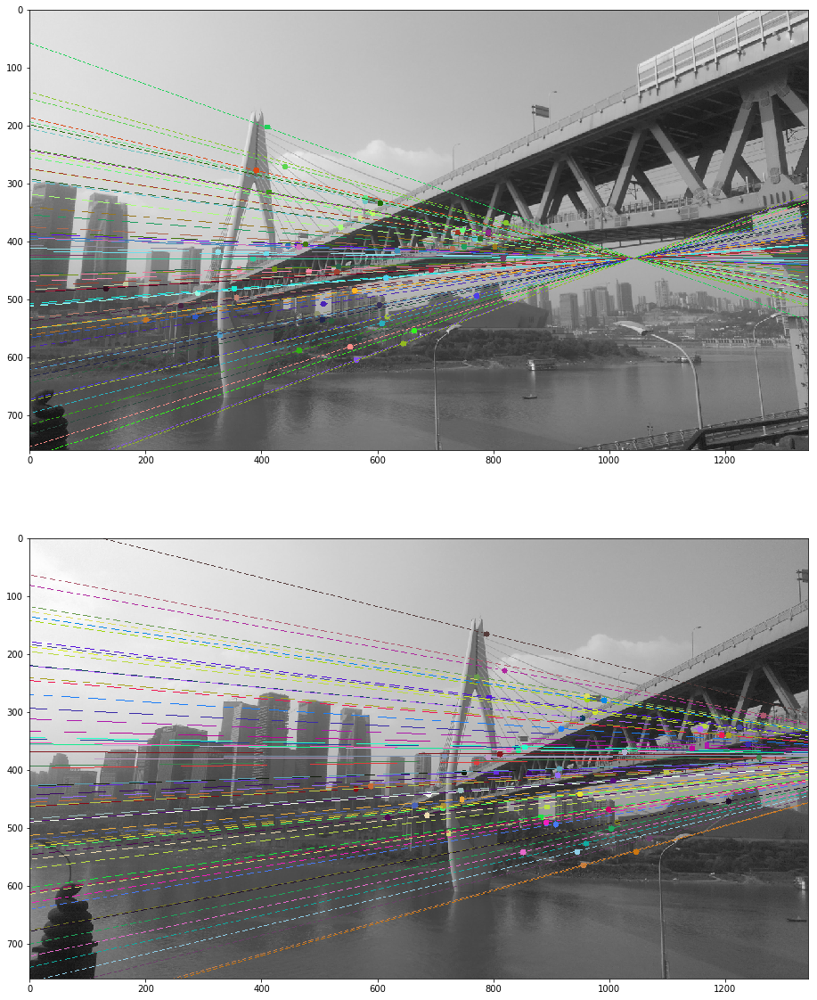

In [46]:
def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2

# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv2.computeCorrespondEpilines(pts2.reshape(-1,1,2), 2,F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(img1,img2,lines1,pts1,pts2)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(pts1.reshape(-1,1,2), 1,F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(img2,img1,lines2,pts2,pts1)
plt.figure(figsize=(40,20)) 
plt.subplot(211),plt.imshow(img5)
plt.subplot(212),plt.imshow(img3)
plt.show()